# Learning to do Data Science with School Data

In this project I hope to learn about data cleaning and machine learning through practical applications of making a program that takes data from CRDC and uses demographics to predict the level of engagement in gifted/accelerated programs

## First Steps

The first thing I need to try is to open the `CRDC 2015-16 School Data.csv` and figure out if I can read it and make sense out of it.

This first code block opens the CSV file and sets it up as a list of lists so the program will be able to understand it. After the file is opened, the header is seperated from the main body.

In [37]:
from csv import reader

opened_file = open('Data Files/Data Files and Layouts/CRDC 2015-16 School Data.csv')
read_file = reader(opened_file)
crdc = list(read_file)
crdc_header = crdc[0]
crdc = crdc[1:]

The bellow collumns are for different races with a m/f split.

In [38]:
print(crdc_header[55:69])

['SCH_ENR_HI_M', 'SCH_ENR_HI_F', 'SCH_ENR_AM_M', 'SCH_ENR_AM_F', 'SCH_ENR_AS_M', 'SCH_ENR_AS_F', 'SCH_ENR_HP_M', 'SCH_ENR_HP_F', 'SCH_ENR_BL_M', 'SCH_ENR_BL_F', 'SCH_ENR_WH_M', 'SCH_ENR_WH_F', 'SCH_ENR_TR_M', 'SCH_ENR_TR_F']


The translation for the collumns follow

| Field Name | Field Description |
| --- | --- |
| SCH_ENR_HI | Overall Student Enrollment: Hispanic Male |
| SCH_ENR_AM | Overall Student Enrollment: American Indian/Alaska Native |
| SCH_ENR_AS | Overall Student Enrollment: Asian Male |
| SCH_ENR_HP | Overall Student Enrollment: Native Hawaiian/Pacific Islander |
| SCH_ENR_BL | Overall Student Enrollment: Black | 
| SCH_ENR_WH | Overall Student Enrollment: White |
| SCH_ENR_TR | Overall Student Enrollment: Two or More Races |

These collumns contain data on the gifted and tallented program

In [39]:
print(crdc_header[148:162])

['SCH_GTENR_HI_M', 'SCH_GTENR_HI_F', 'SCH_GTENR_AM_M', 'SCH_GTENR_AM_F', 'SCH_GTENR_AS_M', 'SCH_GTENR_AS_F', 'SCH_GTENR_HP_M', 'SCH_GTENR_HP_F', 'SCH_GTENR_BL_M', 'SCH_GTENR_BL_F', 'SCH_GTENR_WH_M', 'SCH_GTENR_WH_F', 'SCH_GTENR_TR_M', 'SCH_GTENR_TR_F']


To translate:

| Field Name | Field Description |
| --- | --- |
| SCH_GTENR_HI | Gifted and Talented Student Enrollment: Hispanic |
| SCH_GTENR_AM | Gifted and Talented Student Enrollment: American Indian/Alaska Native |
| SCH_GTENR_AS | Gifted and Talented Student Enrollment: Asian |
| SCH_GTENR_HP | Gifted and Talented Student Enrollment: Native Hawaiian/Pacific Islander |
| SCH_GTENR_BL | Gifted and Talented Student Enrollment: Black | 
| SCH_GTENR_WH | Gifted and Talented Student Enrollment: White |
| SCH_GTENR_TR | Gifted and Talented Student Enrollment: Two or More Races |

---

## Now for an Example
I want to look at example data to make sure these numbers are definetly what I think they are

In [40]:
for school in crdc:
    name = school[5]
    if name == "Providence High":
        print(school[147], school[55:69], school[148:162])

Yes ['50', '68', '2', '2', '116', '104', '0', '5', '86', '83', '719', '728', '29', '20'] ['2', '8', '0', '0', '26', '26', '0', '2', '8', '14', '236', '236', '8', '5']


These numbers are exactly what I expected to get! Progress!

## The New Challenge
So now I've been able to find some of the data points I am most interested in, but now I need to figure out ways to reduce the size of this data set. The computer I am working on barely has enough memory to store it while the program is running at the moment. I think the first strategy will be to get rid of any records that don't have a gifted and talented program. 

To do this, I will look for any records that have the `Has Gifted and Talented Program` set to No. I believe that the column that I am looking for is `147` so I will opperate under this belief.

In [41]:
print("Origional length:", len(crdc))

crdc_gifted = []

for school in crdc:
    if school[147] == "Yes":
        crdc_gifted.append(school)

print("Shortened List:", len(crdc_gifted))

Origional length: 96360
Shortened List: 55495


This process nearly cut the list in half! Excellent news for my computer. I'm actually going to save this list to a new file for now so I can work from that one.

In [42]:
import csv
with open('Data Files/Data Files and Layouts/CRDC_cleaned.csv', 'w') as csvFile:
    writer = csv.writer(csvFile)
    writer.writerows(crdc_gifted)

In [43]:
del crdc

Now that I only have schools that offer Gifted and Talented programs, I want to know the general sizes of these programs. The min size and max size to start out.

In [44]:
gifted_max_size = 0
gifted_min_size = 200

for school in crdc_gifted:
    gifted_size = int(school[162])+int(school[163])
    if gifted_size > gifted_max_size:
        gifted_max_size = gifted_size
    if gifted_size < gifted_min_size:
        gifted_min_size = gifted_size

print("Max:", gifted_max_size)
print("Min:", gifted_min_size)

Max: 2178
Min: 0


These results are interesting because it seems that there are some schools that offer the program but don't have anyone enrolled and others who have thousands of students enrolled.

## TODO
I want to try to visualyze some of this data and I would also like to figure out how to use a machine learning algorithm to guess the size of gifted program based on other demographic factors. A composite bargraph might be a fun way to visualize the size of gifted programs compared to the size of the school. Visualyzation comes before ML so I can show Crabtree something a little interesting.

## Time to Lear a little about Visualization

My general idea is to use matplotlib and numpy to create a stacked bar chart. This chart will show the proportion of students enrolled in gifted programs compared to the total enrolment of the school. I will start by using the first 10 schools and then see what happens when I use all of them.

First I will need to gather the values for the chart and create a two lists. One with the school size and one with gifted program size.

In [45]:
school_sizes = []
gifted_sizes = []

for school in crdc_gifted:
    school_size = int(school[69])+int(school[70])
    school_sizes.append(school_size)

    gifted_size = int(school[162])+int(school[163])
    gifted_sizes.append(gifted_size)

gifted_proportion = [i / j * 100 for i,j in zip(gifted_sizes, school_sizes)]

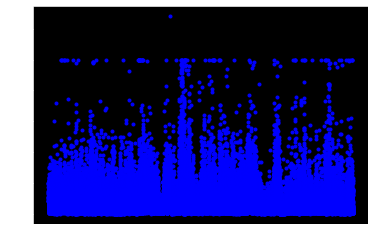

In [46]:
import numpy as np
import matplotlib.pyplot as plt

plt.plot(gifted_proportion, '.b')

plt.show()

A quick word on the data:
The schools are currently grouped by state, so it is reasonable to assert that some states have much higher gifted program enrolment than others. The inverse of this is also true. It looks like the national average for gifted program enrolment is around 30% of the school.
One concerning observation, it appears that one school has a much larger gifted program than school which is a little confusing. I think it's time to find this school with an impossibly large gifted program.

In [47]:
for school in crdc_gifted:
    school_size = int(school[69])+int(school[70])
    gifted_size = int(school[162])+int(school[163])
    if gifted_size > school_size:
        print(school[:6])
        print("School enrolement:",school_size, "\t\t Gifted enrolement:", gifted_size)
         

['KY', 'KENTUCKY', '2105730', 'Warren County', '839', 'Rivendell High School']
School enrolement: 32 		 Gifted enrolement: 41


[Rivendell High](https://ocrdata.ed.gov/Page?t=s&eid=487617&syk=8&pid=2275) is quite a small school.
How is it possible to have more children enrolled in the gifted program than there are in the school?
I cannot find any seperate information on Rivendell High, so they simply need to be removed from the data set and then replot the data.

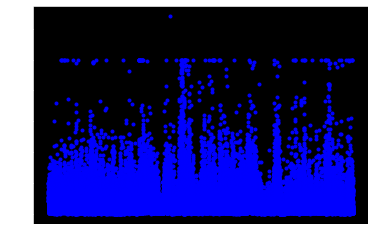

In [48]:
for school in crdc_gifted:
    if school[2] == '2105730':
        crdc_gifted.remove(school)

school_sizes = []
gifted_sizes = []

for school in crdc_gifted:
    school_size = int(school[69])+int(school[70])
    school_sizes.append(school_size)

    gifted_size = int(school[162])+int(school[163])
    gifted_sizes.append(gifted_size)

gifted_proportion = [i / j * 100 for i,j in zip(gifted_sizes, school_sizes)]

plt.plot(gifted_proportion, '.b')

plt.show()

This plot is much more beliveable.

## Going Forward
The next thing I need to do before I consider any machine learning is to find some way to decrease the number of columns in this data set. Currently there are almost 2000 data points for each school, but most of these probably have no effect on the size of the gifted and talented program. 

| Column Ranges | Subject Matter | Importance |
| --- | --- | --- |
| 1 - 8 | Identification | Low |
| 9 - 32 | School Characteristics | Revisit |
| 33 - 147 | Enrollment | High |
| 148 - 168 | Gifted and Talented | High |
| 169 - 189 | Dual Enrollment | Possible | 
| 190 - 191 | Credit Recovery | Low | 
| 192 - 319 | Algebra I | Possible |
| 320 - 343 | Geometry | Possible |
| 344 - 365 | Algebra II | Possible | 
| 366 - 387 | Calculus | Possible |
| 388 - 409 | Advanced Mathematics | Possible |
| 410 - 431 | Biology | Possible |
| 432 - 453 | Chemistry | Possible |
| 454 - 475 | Physics | Possible |
| 476 - 491 | Single-sex Classes | Low |
| 492 - 657 | Advanced Placement | Medium | 
| 658 - 678 | International Baccalaureate | Medium |
| 679 - 698 | SAT and ACT Exams | Medium |
| 699 - 761 | Corporal Punishment | Low |
| 762 - 942 | Suspensions | Low |
| 943 - 1076 | Expulsions | Low |
| 1077 - 1114 | Tranfers | Low |
| 1115 - 1190 | Referrals and Arrests | Low |
| 1191 - 1204 | Offenses | Low |
| 1205 - 1327 | Restraint and Seclusion | Low |
| 1328 - 1464 | Harassment and Bullying | Low |
| 1465 - 1486 | Chronic Absenteeism | Low |
| 1487 - 1785 | Retention | Low |
| 1786 - 1795 | Single-Sex Athletics | Low |
| 1796 - 1814 | School Expenditures | Medium | 
| 1815 - 1828 | School Support | Medium | 
| 1829 - 1836 | Justice Facility | Low |

I now need to remove all columns that I deemed low importance to this endeaver from my data set and then look into instances of incomplete data to see how I want to handle that. My guess is that I will start with training a model using only the high importance records and go from there. 

In [49]:
crdc_relevant = []

for school in crdc_gifted:
    relevant = school[35:168]
    del relevant[115] # this is the indicator for Gifted and Talented programs which is yes for all
    del relevant[112] # this was giving me issues
    crdc_relevant.append(relevant)

crdc_relevant_header = crdc_header[35:168]
del crdc_relevant_header[115]
del crdc_relevant_header[112]
print(crdc_relevant_header)

del crdc_gifted

['SCH_PSENR_HI_M', 'SCH_PSENR_HI_F', 'SCH_PSENR_AM_M', 'SCH_PSENR_AM_F', 'SCH_PSENR_AS_M', 'SCH_PSENR_AS_F', 'SCH_PSENR_HP_M', 'SCH_PSENR_HP_F', 'SCH_PSENR_BL_M', 'SCH_PSENR_BL_F', 'SCH_PSENR_WH_M', 'SCH_PSENR_WH_F', 'SCH_PSENR_TR_M', 'SCH_PSENR_TR_F', 'TOT_PSENR_M', 'TOT_PSENR_F', 'SCH_PSENR_LEP_M', 'SCH_PSENR_LEP_F', 'SCH_PSENR_IDEA_M', 'SCH_PSENR_IDEA_F', 'SCH_ENR_HI_M', 'SCH_ENR_HI_F', 'SCH_ENR_AM_M', 'SCH_ENR_AM_F', 'SCH_ENR_AS_M', 'SCH_ENR_AS_F', 'SCH_ENR_HP_M', 'SCH_ENR_HP_F', 'SCH_ENR_BL_M', 'SCH_ENR_BL_F', 'SCH_ENR_WH_M', 'SCH_ENR_WH_F', 'SCH_ENR_TR_M', 'SCH_ENR_TR_F', 'TOT_ENR_M', 'TOT_ENR_F', 'SCH_ENR_LEP_M', 'SCH_ENR_LEP_F', 'SCH_ENR_504_M', 'SCH_ENR_504_F', 'SCH_ENR_IDEA_M', 'SCH_ENR_IDEA_F', 'SCH_LEPENR_HI_M', 'SCH_LEPENR_HI_F', 'SCH_LEPENR_AM_M', 'SCH_LEPENR_AM_F', 'SCH_LEPENR_AS_M', 'SCH_LEPENR_AS_F', 'SCH_LEPENR_HP_M', 'SCH_LEPENR_HP_F', 'SCH_LEPENR_BL_M', 'SCH_LEPENR_BL_F', 'SCH_LEPENR_WH_M', 'SCH_LEPENR_WH_F', 'SCH_LEPENR_TR_M', 'SCH_LEPENR_TR_F', 'TOT_LEPENR_M', 'TO

Now I want to take all of these values which are currently stored as strings and make them integers so they are easier to work with. This line makes sure I removed all the columns that aren't supposed to be integers.

In [50]:
freq_bad = {}

for school in crdc_relevant:
    for item in school:
        if item == "Yes" or item == "No":
            if school.index(item) in freq_bad:
                freq_bad[school.index(item)] += 1
            else:
                freq_bad[school.index(item)] = 1
print(freq_bad)

{}


Now I can convert the strings to integers

In [51]:
for school in crdc_relevant:
    school = [int(i) for i in school]

Just for fun, I want to make another graph. This time I want to graph proportion of white enrollment against propoortion of students in gifted and talented programs. 

White Male enrollment should be stored in index 30 and White Female enrollment in 31. Total enrollment should be in 34 and 35. I believe total gifted enrollment will be found at indecies 125 and 126.

In [52]:
print(crdc_relevant[15][30:32])
print(crdc_relevant[15][34:36])
print(crdc_relevant[15][125:127])

['233', '227']
['422', '381']
['44', '53']


These numbers appear reasonalbe for my assumption. Now I want to get proportions for each of these so I can graph them properly.

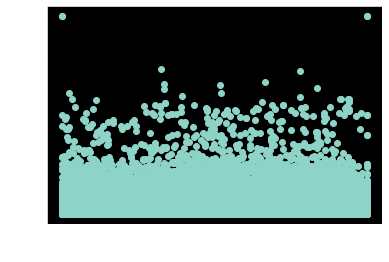

In [53]:
proportions_white = []
proportions_gifted = []

for school in crdc_relevant:
    white = int(school[30]) + int(school[31])
    gifted = int(school[125]) + int(school[127])
    total = int(school[34]) + int(school[35])

    proportions_white.append(white/total*100)
    proportions_gifted.append(gifted/total*100)

plt.scatter(proportions_white, proportions_gifted)

plt.ylabel("Proportion of School in Gifted Program")
plt.xlabel("Proportion of School that is White")

plt.show()

This is not quite what I was expecting to see especially when compared to the earlier graph that so many higher percentages for proportion in gifted program. This might mean that any school that was showing high percentages might not have complete demographic data or gifted data. I feel like this graph means there is much more cleaning that needs to be done to the data before it is readable.

## Now for the Hard Part
I am again saving the list in a csv file so that I can use a library called pandas to handle the data I'm putting into scikit_learn for machine learning.

In [54]:
import csv
with open('Data Files/Data Files and Layouts/CRDC_cleaned.csv', 'w') as csvFile:
    writer = csv.writer(csvFile, lineterminator='\n')
    writer.writerow(crdc_relevant_header)
    writer.writerows(crdc_relevant)

del crdc_relevant

In [55]:
import pandas as pd

crdc = pd.read_csv('Data Files/Data Files and Layouts/CRDC_cleaned.csv', encoding='windows-1252')


In [56]:
crdc_for_ml = crdc.drop(crdc.columns[0:20], axis=1)
crdc_for_ml = crdc_for_ml.drop(crdc.columns[36:112], axis=1)
print(crdc_for_ml.columns)

Index(['SCH_ENR_HI_M', 'SCH_ENR_HI_F', 'SCH_ENR_AM_M', 'SCH_ENR_AM_F',
       'SCH_ENR_AS_M', 'SCH_ENR_AS_F', 'SCH_ENR_HP_M', 'SCH_ENR_HP_F',
       'SCH_ENR_BL_M', 'SCH_ENR_BL_F', 'SCH_ENR_WH_M', 'SCH_ENR_WH_F',
       'SCH_ENR_TR_M', 'SCH_ENR_TR_F', 'TOT_ENR_M', 'TOT_ENR_F',
       'SCH_GTENR_HI_M', 'SCH_GTENR_HI_F', 'SCH_GTENR_AM_F', 'SCH_GTENR_AS_M',
       'SCH_GTENR_AS_F', 'SCH_GTENR_HP_M', 'SCH_GTENR_HP_F', 'SCH_GTENR_BL_M',
       'SCH_GTENR_BL_F', 'SCH_GTENR_WH_M', 'SCH_GTENR_WH_F', 'SCH_GTENR_TR_M',
       'SCH_GTENR_TR_F', 'TOT_GTENR_M', 'TOT_GTENR_F', 'SCH_GTENR_LEP_M',
       'SCH_GTENR_LEP_F', 'SCH_GTENR_IDEA_M', 'SCH_GTENR_IDEA_F'],
      dtype='object')


In [57]:
#feature matrix
X = crdc_for_ml[crdc_for_ml.columns[:16]].values

#responce vector
y = crdc_for_ml[crdc_for_ml.columns[28]].add(crdc_for_ml[crdc_for_ml.columns[29]]).values

In [63]:
from sklearn.model_selection import train_test_split 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4)

In [64]:
from sklearn.linear_model import LinearRegression
from sklearn import metrics
%matplotlib inline

regressor = LinearRegression()
regressor.fit(X_train, y_train)


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [65]:
reg_coef = pd.DataFrame(regressor.coef_,crdc_for_ml.columns[:16],['Columns'])
reg_coef

,Columns
SCH_ENR_HI_M,7.779406e+10
SCH_ENR_HI_F,-7.779406e+10
SCH_ENR_AM_M,7.779406e+10
SCH_ENR_AM_F,-7.779406e+10
SCH_ENR_AS_M,7.779406e+10
SCH_ENR_AS_F,-7.779406e+10
SCH_ENR_HP_M,7.779406e+10
SCH_ENR_HP_F,-7.779406e+10
SCH_ENR_BL_M,7.779406e+10
SCH_ENR_BL_F,-7.779406e+10


In [66]:
y_pred = regressor.predict(X_test)

In [67]:
df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
df1 = df.head(25)
df1

,Actual,Predicted
0,9,7.722140
1,7,21.200656
2,9,-4.527371
3,5,7.157687
4,43,39.579562
5,4,20.856906
6,63,16.774875
7,54,28.530734
8,21,42.212375
9,12,21.022922


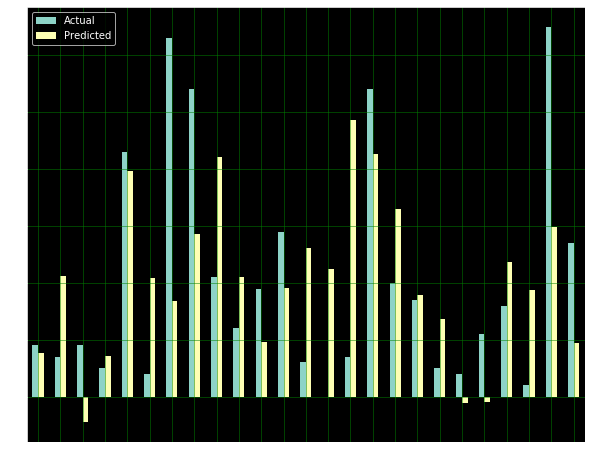

In [68]:
df1.plot(kind='bar',figsize=(10,8))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()